# Plot

## All nodes

In [2]:
def plot_skeleton_nodes(sk_swc):
    # Plot all nodes
    plt.figure(figsize = (8,8))
    plt.scatter(sk_swc['x'], sk_swc['y'], color='gray', label='All Nodes', s=0.1)
    
    # Plot soma
    mask_soma = sk_swc["parent"] == -1
    soma_df = sk_swc[mask_soma]
    plt.scatter(soma_df["x"], soma_df["y"], color="red", s=10, label="Soma")
    
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.title('All nodes')
    plt.legend()
    
    plt.axis('equal')  # Ensures equal aspect ratio
    plt.gca().invert_yaxis()
    plt.autoscale()  # Autoscale axes based on data
    plt.show()

## Plot by levels

In [2]:
def plot_skeleton_by_levels_2d(sk_swc_dend_levels, level_type, level_you_want, root_id, dir_name, save):
    """
    Plot skeleton dendrites by different dendrites level.
    Parameters:
        sk_swc_dend_levels: DataFrame containing SWC file filtered by dendrites and added centrifugal level.
        level_type: select between "cf_level" or "br_level"
        level_you_want: specify how many levels you want to visualize.
                        - If an integer, only visualize levels ≤ level_you_want
                        - If "max", visualize all levels
    """
    fig, ax = plt.subplots(figsize=(8, 8))

    # Filter levels
    if isinstance(level_you_want, int):
        filtered_df = sk_swc_dend_levels[(sk_swc_dend_levels[level_type] <= level_you_want) & 
                                         (sk_swc_dend_levels[level_type] >= 1)]
    elif level_you_want == "max":
        filtered_df = sk_swc_dend_levels[sk_swc_dend_levels[level_type] >= 1]  # Exclude levels < 1
    else:
        raise ValueError("check level_you_want; must be integer or 'max'.")

    # Extract node positions
    x = filtered_df['x'].values
    y = filtered_df['y'].values
    levels = filtered_df[level_type].values
    
    # colormap for levels
    cmap = plt.get_cmap('jet')
    norm = plt.Normalize(min(levels), max(levels))  # Normalize level 1-12 into 0-1 to match cmap
    colors = [cmap(norm(level)) for level in levels]  # Assign colors based on normalized levels
    
    # Plot nodes
    ax.scatter(x, y, c=colors, s=5)
    
    # Plot soma (assuming ID 1 is the soma)
    soma_df = sk_swc_dend_levels[sk_swc_dend_levels['id'] == 1]  # Use 1 instead of 0 if needed
    if not soma_df.empty:
        soma_x = soma_df['x'].values
        soma_y = soma_df['y'].values
        ax.scatter(soma_x, soma_y, color='red', marker="^", s=100, edgecolors='black')  

    # Create legend
    unique_levels = np.unique(levels)
    legend_patches = [mpatches.Patch(color=cmap(norm(level)), label=f"Level {level}") for level in unique_levels]
    ax.legend(handles=legend_patches, title="Node Levels", loc="upper right")

    # Ensure auto-scaling and aspect ratio handling
    ax.set_aspect('auto')  # Allow automatic aspect ratio
    ax.autoscale()  # Auto-scale axes to fit data
    ax.invert_yaxis()
    plt.axis('equal')  # Keep equal aspect ratio if possible
    
    # Axis labels and title
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_title(f"Skeleton dendrites {level_type} order")

    # Save file if you want
    if save == True:
        fname = f"{root_id}_{level_type}_2d.png"
        plt.savefig(dir_name + fname, dpi=300, format='png')
        plt.close(fig)
    
    plt.show()


In [3]:
def plot_skeleton_by_levels_3d(sk_swc_dend_levels, level_type, level_you_want):
    """
    Plot skeleton dendrties in 3d by centrifugal level
    
    Parameters:
        sk_swc_dend_levels: DataFrame containing SWC file filtered by dendrites and added centrifugal level.
        level_type: select between "cf_level" or "br_level"
        level_you_want: specify how many levels you want to visualize.
                        - If an integer, only visualize levels ≤ level_you_want
                        - If "max", visualize all levels
    """
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # Filter levels
    if isinstance(level_you_want, int):
        filtered_df = sk_swc_dend_levels[(sk_swc_dend_levels[level_type] <= level_you_want) & 
                                         (sk_swc_dend_levels[level_type] >= 1)]
    elif level_you_want == "max":
        filtered_df = sk_swc_dend_levels[sk_swc_dend_levels[level_type] >= 1]  # Exclude levels < 1
    else:
        raise ValueError("check level_you_want; must be integer or 'max'.")
    
    # Extract node positions
    x = filtered_df['x'].values
    y = filtered_df['y'].values
    z = filtered_df['z'].values
    levels = filtered_df[level_type].values

    # Create colormap for levels
    cmap = plt.get_cmap('jet')
    norm = plt.Normalize(min(levels), max(levels))
    colors = [cmap(norm(level)) for level in levels]
    
    # Plot nodes
    ax.scatter(x, z, y, c = colors, s = 5)

    # Plot soma (assuming ID 1 is the soma)
    soma_df = sk_swc_dend_levels[sk_swc_dend_levels['id'] == 1]  # Use 1 instead of 0 if needed
    if not soma_df.empty:
        soma_x = soma_df['x'].values
        soma_y = soma_df['y'].values
        soma_z = soma_df['z'].values
        ax.scatter(soma_x, soma_z, soma_y, color='red', s=100, edgecolors='black', label="Soma")  

    # Create legend
    unique_levels = np.unique(levels)
    legend_patches = [mpatches.Patch(color=cmap(norm(level)), label=f"Level {level}") for level in unique_levels]
    
    # Add legend to the plot
    ax.legend(handles=legend_patches, title="Node Levels", loc="upper right")
    
    # Autoscale the axes
    ax.set_box_aspect([1, 1, 1])  # Keep equal aspect ratio
    
    # Axis labels
    ax.set_xlabel("X")
    ax.set_ylabel("Z")
    ax.set_zlabel("Y")
    ax.set_title(f"3D Skeleton Structure")

    plt.show()

In [4]:
def plot_skeleton_by_levels_3d_interactive(sk_swc_dend_levels, level_type, level_you_want, root_id, dir_name, save):
    """
    Plot skeleton dendrites in 3D interactively by centrifugal level using Plotly.
    
    Parameters:
        sk_swc_dend_levels: DataFrame containing SWC file filtered by dendrites and added centrifugal level
        level_type: select between "cf_level" or "br_level"
        level_you_want: specify how many levels you want to visualize.
                        - If an integer, only visualize levels ≤ level_you_want
                        - If "max", visualize all levels
    """
    # Filter levels
    # if isinstance(level_you_want, int):
    #     filtered_df = sk_swc_dend_levels[(sk_swc_dend_levels[level_type] <= level_you_want) & 
    #                                      (sk_swc_dend_levels[level_type] >= 1)]
    # elif level_you_want == "max":
    #     filtered_df = sk_swc_dend_levels[sk_swc_dend_levels[level_type] >= 1]  # Exclude levels < 1
    # else:
    #     raise ValueError("check level_you_want; must be integer or 'max'.")

    if isinstance(level_you_want, int):
        filtered_df = sk_swc_dend_levels[(sk_swc_dend_levels[level_type] <= level_you_want)]
    elif level_you_want == "max":
        filtered_df = sk_swc_dend_levels  # Exclude levels < 1
    else:
        raise ValueError("check level_you_want; must be integer or 'max'.")
        
    # Extract node positions
    x = filtered_df['x'].values
    y = filtered_df['y'].values
    z = filtered_df['z'].values
    levels = filtered_df[level_type].values
    
    # Create colormap for levels
    cmap = mpl.colormaps['jet']
    norm = plt.Normalize(min(levels), max(levels))
    colors = [cmap(norm(level)) for level in levels]
    colors_hex = [f'rgba({int(c[0]*255)},{int(c[1]*255)},{int(c[2]*255)},1)' for c in colors]
    
    # Create scatter plot
    fig = go.Figure()
    fig.add_trace(go.Scatter3d(
        x=x, y=y, z=z,
        mode='markers',
        marker=dict(size=3, color=colors_hex),
        text=[f'Level {lvl}' for lvl in levels],
        hoverinfo='text'
    ))

    # Draw edges (connect parent-child)
    edge_x = []
    edge_y = []
    edge_z = []
    
    for _, row in filtered_df.iterrows():
        parent_id = row['parent']
        if parent_id != -1:
            parent_row = filtered_df[filtered_df['id'] == parent_id]
            if not parent_row.empty:
                px, py, pz = parent_row[['x', 'y', 'z']].values[0]
                edge_x.extend([px, row['x'], None])
                edge_y.extend([py, row['y'], None])
                edge_z.extend([pz, row['z'], None])
    
    fig.add_trace(go.Scatter3d(
        x=edge_x, y=edge_y, z=edge_z,
        mode='lines',
        line=dict(color='gray', width=1),
        hoverinfo='none'
    ))

    # Add Soma as a Sphere
    soma = filtered_df[filtered_df['id'] == 0]
    if not soma.empty:
        soma_x, soma_y, soma_z = soma[['x', 'y', 'z']].values[0]
        u = np.linspace(0, 2 * np.pi, 20)
        v = np.linspace(0, np.pi, 10)
        sphere_x = 5 * np.outer(np.cos(u), np.sin(v)) + soma_x
        sphere_y = 5 * np.outer(np.sin(u), np.sin(v)) + soma_y
        sphere_z = 5 * np.outer(np.ones(np.size(u)), np.cos(v)) + soma_z

        fig.add_trace(go.Surface(
            x=sphere_x, y=sphere_y, z=sphere_z,
            colorscale=[[0, 'black'], [1, 'black']],
            showscale=False,
            opacity=0.4
        ))
    
    # Set layout
    fig.update_layout(
        title="3D Skeleton Structure (Interactive)",
        width=1200,
        height=900,
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z'
        ),
        margin=dict(l=0, r=0, b=0, t=40)
    )

    # Save file if you want
    if save == True:
        fname = f"{root_id}_{level_type}_3d_interactive.png"
        fig.write_image(dir_name + fname)

    # Full screen option
    from IPython.display import display
    display(fig)

## Plot by distances

In [5]:
def red_black_blue_cmap():
    """ Custom colormap for red-black-blue """
    colors = [(1, 0, 0),  # Red (start)
              (0, 0, 0),  # Black (middle)
              (0, 0, 1)]   # Blue (end)

    # create list of colors [0 1] from red-black-blue there are 256 colors in between equidistantly
    return mcolors.LinearSegmentedColormap.from_list("RedBlackBlue", colors, N=256)

In [6]:
def plot_skeleton_distance_2d(sk_swc_dend_levels_all, root_id, dir_name, save, view = "xy"):
    """ Plot skeleton nodes by distance. Calculate distance first from compute_skeleton_tree_distances. """

    fig, ax = plt.subplots(figsize = (8, 6))

    # Normalize distance for colormap scaling
    norm = plt.Normalize(sk_swc_dend_levels_all["distance_from_soma"].min(),
                         sk_swc_dend_levels_all["distance_from_soma"].max())

    # Use the custom colormap
    rkb_cmap = red_black_blue_cmap()

    # Select coordinate pairs based on chosen view
    if view == "xy":
        x, y = sk_swc_dend_levels_all["x"], sk_swc_dend_levels_all["y"]
        xlabel, ylabel = "X", "Y"
    elif view == "xz":
        x, y = sk_swc_dend_levels_all["x"], sk_swc_dend_levels_all["z"]
        xlabel, ylabel = "X", "Z"
    elif view == "yz":
        x, y = sk_swc_dend_levels_all["y"], sk_swc_dend_levels_all["z"]
        xlabel, ylabel = "Y", "Z"
    else:
        raise ValueError("Invalid view. Choose 'xy', 'xz', or 'yz'.")

    # Plot skeleton
    # scatter = ax.scatter(x, y, c = sk_swc_dend_levels_all["distance_from_soma"], norm = norm,
    #                     cmap = rkb_cmap, s = 5)
    
    cmap_jet = plt.get_cmap('jet')
    scatter = ax.scatter(x, y, c = sk_swc_dend_levels_all["distance_from_soma"], norm = norm,
                    cmap = cmap_jet, s = 5)

    # Labels and title
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title("Skeleton distance plot")

    # Ensure auto-scaling and aspect ratio handling
    ax.set_aspect('auto')  # Allow automatic aspect ratio
    ax.autoscale()  # Auto-scale axes to fit data
    ax.invert_yaxis()
    plt.axis('equal')  # Keep equal aspect ratio if possible
    
    # Add colorbar
    cbar = plt.colorbar(scatter, ax=ax)

    # Save file if you want
    if save == True:
        fname = f"{root_id}_soma_dist_2d.png"
        plt.savefig(dir_name + fname, dpi=300, format='png')
        plt.close(fig)

    plt.show()

In [7]:
def plot_skeleton_distance_3d(sk_swc_dend_levels_all):
    fig = plt.figure(figsize = (8, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Normalize distance for colormap scaling
    norm = plt.Normalize(sk_swc_dend_levels_all["distance_from_soma"].min(),
                     sk_swc_dend_levels_all["distance_from_soma"].max())

    # Use the custom colormap
    rkb_cmap = red_black_blue_cmap()
    x =  sk_swc_dend_levels_all["x"]
    y =  sk_swc_dend_levels_all["y"]
    z =  sk_swc_dend_levels_all["z"]

    # Plot
    # scatter = ax.scatter(x, z, y, c =  sk_swc_dend_levels_all["distance_from_soma"], norm = norm,
    #                      cmap = rkb_cmap, s = 5)
    cmap_jet = plt.get_cmap("jet")
    scatter = ax.scatter(x, z, y, c =  sk_swc_dend_levels_all["distance_from_soma"], norm = norm,
                     cmap = cmap_jet, s = 5)

    # Plot soma
    soma_df = sk_swc_dend_levels[sk_swc_dend_levels_all['id'] == 0]  # Use 1 instead of 0 if needed
    if not soma_df.empty:
        soma_x = soma_df['x'].values
        soma_y = soma_df['y'].values
        soma_z = soma_df['z'].values
        ax.scatter(soma_x, soma_z, soma_y, color='red', s=100, edgecolors='black', label="Soma")  

    # Autoscale the axes
    ax.set_box_aspect([1, 1, 1])  # Keep equal aspect ratio
    
    # Axis labels
    ax.set_xlabel("X")
    ax.set_ylabel("Z")
    ax.set_zlabel("Y")
    ax.set_title(f"3D Skeleton Structure")
    
    plt.show()

In [8]:
def plot_skeleton_distance_3d_interactive(sk_swc_dend_levels_all, root_id, dir_name, save):
    """
    Plot skeleton nodes in 3D interactively, colored by their distance from the soma.
    
    Parameters:
        sk_swc_dend_levels_all: DataFrame containing skeleton data with "x", "y", "z", and "distance_from_soma".
    """
    
    # Extract node positions
    x = sk_swc_dend_levels_all["x"].values
    y = sk_swc_dend_levels_all["y"].values
    z = sk_swc_dend_levels_all["z"].values
    distances = sk_swc_dend_levels_all["distance_from_soma"].values
    
    # Unapproved pretty colorscale
    # cmap = plt.get_cmap("coolwarm")  # Choose a colormap
    # norm = plt.Normalize(min(distances), max(distances))
    # colors = [cmap(norm(d)) for d in distances]
    # colors_hex = [f'rgba({int(c[0]*255)},{int(c[1]*255)},{int(c[2]*255)},1)' for c in colors]

    # Ugly but practical colorscale
    #cmap = red_black_blue_cmap()
    cmap = plt.get_cmap("jet")
    norm = plt.Normalize(min(distances), max(distances))
    colors_hex = [cmap(norm(d)) for d in distances]
    
    
    # Create scatter plot
    fig = go.Figure()
    fig.add_trace(go.Scatter3d(
        x=x, y=y, z=z,
        mode='markers',
        marker=dict(size=3, color=colors_hex),
        text=[f'Distance: {d:.2f}' for d in distances],
        hoverinfo='text'
    ))

    # Draw edges (connect parent-child if such information exists)
    edge_x, edge_y, edge_z = [], [], []
    
    for _, row in sk_swc_dend_levels_all.iterrows():
        parent_id = row.get('parent', -1)  # Default to -1 if no parent column
        if parent_id != -1:
            parent_row = sk_swc_dend_levels_all[sk_swc_dend_levels_all['id'] == parent_id]
            if not parent_row.empty:
                px, py, pz = parent_row[['x', 'y', 'z']].values[0]
                edge_x.extend([px, row['x'], None])
                edge_y.extend([py, row['y'], None])
                edge_z.extend([pz, row['z'], None])

    fig.add_trace(go.Scatter3d(
        x=edge_x, y=edge_y, z=edge_z,
        mode='lines',
        line=dict(color='gray', width=1),
        hoverinfo='none'
    ))

    # Add Soma as a Sphere
    soma = sk_swc_dend_levels_all[sk_swc_dend_levels_all['id'] == 0]
    if not soma.empty:
        soma_x, soma_y, soma_z = soma[['x', 'y', 'z']].values[0]
        u = np.linspace(0, 2 * np.pi, 20)
        v = np.linspace(0, np.pi, 10)
        sphere_x = 5 * np.outer(np.cos(u), np.sin(v)) + soma_x
        sphere_y = 5 * np.outer(np.sin(u), np.sin(v)) + soma_y
        sphere_z = 5 * np.outer(np.ones(np.size(u)), np.cos(v)) + soma_z

        fig.add_trace(go.Surface(
            x=sphere_x, y=sphere_y, z=sphere_z,
            colorscale=[[0, 'black'], [1, 'black']],
            showscale=False,
            opacity=0.4
        ))

    # Set layout
    fig.update_layout(
        title="3D Skeleton Distance Plot (Interactive)",
        width=1200,
        height=900,
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z'
        ),
        margin=dict(l=0, r=0, b=0, t=40)
    )

    # Save file if you want
    if save == True:
        fname = f"{root_id}_soma_dist_3d_interactive.png"
        fig.write_image(dir_name + fname)

    # Full screen option
    # from IPython.display import display
    # display(fig)


## Mesh plot (optional)

In [49]:
""" 
    Check mesh to see if skeleton is correct 
    (Neuroglancer is recommended)
"""

# Quant check? This neuron looks weird - dendrites wrapping around the soma, should not happen.
# Indeed, when same neuron's mesh is plotted, dendrties are shown normally

# mm = trimesh_io.MeshMeta(
#   cv_path=client.info.segmentation_source(),
#   disk_cache_path="meshes",
# )

# mesh = mm.mesh(seg_id=root_id)


def downsample_mesh(vertices, faces, sample_fraction=0.1):
    """ Downsamples the number of vertices and faces by selecting a fraction of them. """
    num_vertices = len(vertices)
    sampled_indices = np.random.choice(num_vertices, int(sample_fraction * num_vertices), replace=False)
    sampled_vertices = vertices[sampled_indices]
    
    # Filter faces to keep only those with all vertices in sampled set
    face_mask = np.all(np.isin(faces, sampled_indices), axis=1)
    sampled_faces = faces[face_mask]
    
    return sampled_vertices, sampled_faces

def plot_3d_mesh(mesh, sample_fraction=0.1):
    # Extract vertices and faces
    vertices, faces = downsample_mesh(mesh.vertices, mesh.faces, sample_fraction)
    
    # Get x, y, z coordinates of sampled vertices
    x, y, z = vertices[:, 0], vertices[:, 1], vertices[:, 2]
    
    # Create a 3D mesh object
    mesh_plot = go.Mesh3d(
        x=x, y=y, z=z,
        i=faces[:, 0], j=faces[:, 1], k=faces[:, 2],
        color='lightblue', opacity=0.5
    )
    
    # Create scatter plot for vertices (optional)
    scatter_plot = go.Scatter3d(
        x=x, y=y, z=z,
        mode='markers',
        marker=dict(size=2, color='grey', opacity=0.5),
        name='Vertices'
    )
    
    # Create figure and add traces
    #fig = go.Figure(data=[mesh_plot, scatter_plot])
    fig = go.Figure(data=scatter_plot)
    fig.update_layout(
        scene=dict(
            xaxis_title='X (nm)',
            yaxis_title='Y (nm)',
            zaxis_title='Z (nm)'
        ),
        title='3D Mesh Visualization (Downsampled)',
        autosize=True,
        width=1400,
        height=1000,
    )
    
    fig.show()

# Example usage with a sample mesh file
# mesh = trimesh.load_mesh("path_to_your_mesh.obj")
#plot_3d_mesh(mesh, sample_fraction=0.1)

# Dendrite ordering

## Preprocessing

In [9]:
def preproc_skeleton(sk_swc, root_id, dir_name, save, stumps_threshold = 6):
    """
    This preprocessing works in two steps.
    1) Remove nodes that are within <6um soma radius 
    2) Remove any nodes of each dendrites that's under 6 nodes.
    """
    # Ensure sk_swc is a copy to avoid SettingWithCopyWarning
    sk_swc = sk_swc.copy()
    
    ################### remove nodes under 6um ##################
    # Find the soma node
    soma_node = sk_swc[sk_swc['parent'] == -1]
    soma_id = soma_node.iloc[0]['id']
    
    # Calculate Euclidean distance from the soma manually
    soma_coords = soma_node[['x', 'y', 'z']].values[0]
    sk_swc.loc[:, 'distance_from_soma'] = sk_swc.apply(
        lambda row: math.sqrt((soma_coords[0] - row['x'])**2 +
                              (soma_coords[1] - row['y'])**2 +
                              (soma_coords[2] - row['z'])**2), axis=1)
    
    to_remove = sk_swc[(sk_swc['distance_from_soma'] < 6) & (sk_swc['id'] != soma_id)]
    
    # If there's nothing to remove, keep the original
    if to_remove.empty:
        print("None changed")
    else:
        id_map = {}
        for idx, row in to_remove.iterrows():
            # finding to_remove's children because they will be directly connected to soma instead
            children = sk_swc[sk_swc['parent'] == row['id']]['id'].tolist()
            for child in children:
                id_map[child] = soma_id  #redirect children to soma
        
        # Replace parent items to soma for children whose parents are now removed!
        sk_swc.loc[:, 'parent'] = sk_swc['parent'].replace(id_map)
        
        # remove nodes - first filter out nodes that should be removed
        mask = ~sk_swc['id'].isin(to_remove['id'])    # Basically filter out that is NOT to_remove nodes
        sk_swc = sk_swc[mask].copy()
    
    #################### count nodes #######################
    # Identify first-generation children of the soma
    first_level_nodes = sk_swc[sk_swc['parent'] == soma_id]['id'].tolist()
    
    # store dendrite branches and their node counts
    dendrite_branches = {}
    
    # BFS traversal
    for node in first_level_nodes:
        stack = [node]
        nodes_in_branch = set()
    
        while stack:
            current_node = stack.pop()
            nodes_in_branch.add(current_node)
    
            # find children of the current node
            children = sk_swc[sk_swc['parent'] == current_node]['id'].tolist()
            stack.extend(children)
    
        # Store the branch and its node count
        dendrite_branches[node] = len(nodes_in_branch)

    ################ Plot num of nodes ##########################
    # Count nodes before removing stumps to validate how many nodes they have after soma distance filtering
    if save == True:
        plt.figure(figsize=(10, 5))
        x_labels = [f'{i+1}' for i in range(len(dendrite_branches.values()))]
        plt.bar(x_labels, dendrite_branches.values(), color='skyblue')
        plt.yscale('log')   # Set log scale on y-axis
        plt.title("Number of nodes")

        # Ensure the directory exists before saving
        filename_png = f"dendrite_nodecounts_{root_id}.png"
        output_path_png = os.path.join(dir_name, filename_png)
        plt.savefig(output_path_png, dpi=300, format='png')
        plt.close()
        print(f"Dendrite histogram saved: {output_path_png}")


    #################### remove stumps #######################
    stumps_to_go = {node for node, count in dendrite_branches.items() if count < stumps_threshold}
    
    # Find all the nodes that belong to these short dendrites
    stumps_to_remove = set()
    for node in stumps_to_go:
        stack = [node]
        while stack:
            current_node = stack.pop()
            stumps_to_remove.add(current_node)
            # Find children
            children = sk_swc[sk_swc['parent'] == current_node]['id'].tolist()
            stack.extend(children)
            
    sk_swc = sk_swc[~sk_swc['id'].isin(stumps_to_remove)]
    sk_swc = sk_swc.drop(columns=['distance_from_soma'])


    #################### Recalculate dendrite_branches #######################
    final_dendrite_branches = {}
    remaining_first_level_nodes = sk_swc[sk_swc['parent'] == soma_id]['id'].tolist()

    for node in remaining_first_level_nodes:
        stack = [node]
        nodes_in_branch = set()

        while stack:
            current_node = stack.pop()
            nodes_in_branch.add(current_node)

            # Find children
            children = sk_swc[sk_swc['parent'] == current_node]['id'].tolist()
            stack.extend(children)

        final_dendrite_branches[node] = len(nodes_in_branch)

    ################### Plot and Save Final Histogram #######################
    # if save == True:
    #     plt.figure(figsize=(6, 3))
    #     x_labels = [str(i + 1) for i in range(len(final_dendrite_branches))]
    #     plt.bar(x_labels, final_dendrite_branches.values(), color='skyblue')
    #     #plt.yscale('log')  # Log scale to handle large node counts
    #     plt.xticks(rotation=45)
    #     plt.xlabel("Dendrite Branches")
    #     plt.ylabel("Number of Nodes")
    #     plt.title("Final Number of Nodes per Dendrite")
    
    #     # Ensure the directory exists before saving
    #     filename_png = f"dendrite_nodecounts_{root_id}_6um_removal.png"
    #     output_path_png = os.path.join(dir_name, filename_png)
    #     plt.savefig(output_path_png, dpi=300, format='png')
    #     plt.close()
    #     print(f"Final dendrite histogram saved: {output_path_png}")
        
    return sk_swc, dendrite_branches.values()


In [1]:

def soma_euclidean_dist(sk_swc, root_id):
    """ 
        Calculate euclidean distance to soma
        This is to validate neurons; not really used for preprocessing
    """
    
    # Ensure sk_swc is a copy to avoid SettingWithCopyWarning
    sk_swc = sk_swc.copy()
    
    # Find the soma node
    soma_node = sk_swc[sk_swc['parent'] == -1]
    soma_id = soma_node.iloc[0]['id']
    
    # Calculate Euclidean distance from the soma manually
    soma_coords = soma_node[['x', 'y', 'z']].values[0]
    sk_swc.loc[:, 'eucli_dist'] = sk_swc.apply(
        lambda row: math.sqrt((soma_coords[0] - row['x'])**2 +
                              (soma_coords[1] - row['y'])**2 +
                              (soma_coords[2] - row['z'])**2), axis=1)

    return sk_swc

## Centrifugal order

In [11]:
"""
   Centrifugal level definition by using BFS
   Breadth-First-Search traverse algorithm
   Usage:
       sk_swc_dend_levels = assign_centrifugal_levels(sk_swc_dend)
"""

def assign_centrifugal_levels(sk_swc):
    # Identify root node
    root_node = sk_swc.loc[sk_swc['parent']==-1, 'id'].values[0]
    
    # Create dict to store node levels
    node_levels = {root_node: 0}
    
    # Group by parents and list child within {parent_id: [list_of_children]} 
    child_map = sk_swc.groupby("parent")["id"].apply(list).to_dict()
    
    # Traverse nodes breadth-first: [node, level]
    queue = [(root_node, 0)]
    
    while queue:
        node_id, level = queue.pop(0)     # FIFO queue for BFS
    
        # If the node has children, check how many
        children = child_map.get(node_id, []) # Finds node_id key (parent) and brings their values (children), otherwise return []
    
        if len(children) > 1:
            new_level = level + 1
        else:
            new_level = level
    
        for child in children:
            node_levels[child] = new_level   # Update children's levels: [node, node_level]
            queue.append((child, new_level))  # Update queue same way:   [node, node_level]
    
    # Convert dict to DataFrame and merge with original
    levels_df = pd.DataFrame(list(node_levels.items()), columns=['id', 'cf_level'])
    sk_swc = sk_swc.merge(levels_df, on='id')

    return sk_swc

## Branch order

In [12]:
def assign_branch_clusters(sk_swc):
    """
        Cluster dendrites in branch clusters
        input: sk_swc_dend_levels
    """
    
    # Find the soma node (parent = -1)
    soma_node = sk_swc[sk_swc['parent'] == -1]
    soma_id = soma_node.iloc[0]['id']

    # Find all direct children of soma
    soma_children = sk_swc[sk_swc['parent'] == soma_id]['id'].tolist()

    # Initialize clusters mapping
    node_to_cluster = {}
    
    # Assign each child of soma to its own cluster and traverse descendants
    for idx, root in enumerate(soma_children):
        cluster_id = idx + 1  # Assign unique cluster ids
        queue = deque([root])
        node_to_cluster[root] = cluster_id  # Assign root node to its own cluster

        while queue:
            node = queue.popleft()

            # Get children of the current node
            children = sk_swc[sk_swc['parent'] == node]['id'].tolist()
            for child in children:
                queue.append(child)
                node_to_cluster[child] = cluster_id  # Assign to same cluster as root

    # Assign the cluster ID in a new column
    sk_swc['br_level'] = sk_swc['id'].map(node_to_cluster).fillna(-1).astype(int)

    return sk_swc

## Branch-segment order

In [13]:
def assign_segments_per_branch_level(sk_swc):
    """
    Assign segment IDs to dendrites within each branch level (br_level).
    - Segment numbering restarts at 1 for each br_level.
    - A new segment is assigned at every divergence.
    """
    
    # Ensure 'br_level' and 'parent' columns exist
    if 'br_level' not in sk_swc.columns or 'parent' not in sk_swc.columns:
        raise ValueError("Error: 'br_level' or 'parent' column not found in dataset.")
    
    # Initialize mappings
    node_to_segment = {}  # Map each node to a segment
    
    # Process each branch level separately
    for br_level in sk_swc['br_level'].unique():
        subset = sk_swc[sk_swc['br_level'] == br_level].copy()
        segment_counter = 1  # Restart segment numbering for each br_level

        # Find all root nodes within this branch level (nodes without parents in this level)
        root_nodes = subset[~subset['parent'].isin(subset['id'])]['id'].tolist()

        # Process each root separately
        for root in root_nodes:
            queue = deque([(root, segment_counter)])  # Start each root with a new segment
            segment_counter += 1

            while queue:
                node, segment_id = queue.popleft()
                node_to_segment[node] = segment_id

                # Get children of the current node
                children = subset[subset['parent'] == node]['id'].tolist()

                if len(children) == 1:
                    # Continue same segment if there's only one child
                    queue.append((children[0], segment_id))
                elif len(children) > 1:
                    # If divergence occurs, create new segments for each child
                    for child in children:
                        queue.append((child, segment_counter))
                        segment_counter += 1

    # Assign segment IDs to the dataframe
    sk_swc['segment_id'] = sk_swc['id'].map(node_to_segment).fillna(-1).astype(int)

    return sk_swc


# Assigning synapses

## Distance between nodes stat

In [14]:
def distance_bt_skeleton_nodes(sk_swc_dend_levels):
    distance_bt_nodes = []

    for index, row in sk_swc_dend_levels.iterrows():
        if row["parent"] == -1:
            continue

        parent_row = sk_swc_dend_levels[sk_swc_dend_levels['id'] == row['parent']]
        
        child_pos = np.array([row['x'], row['y'], row['z']])
        parent_pos = np.array([parent_row['x'], parent_row['y'], parent_row['z']])
    
        node_distance = (row['x']-parent_row['x']) **2 + (row['y']-parent_row['y']) **2 + (row['z']-parent_row['z']) **2
        node_distance = math.sqrt(node_distance)
    
        #node_distance = euclidean_distance(child_pos, parent_pos)
    
        #print(f"child location = {child_pos}")
        #print(f"parent location = {parent_pos}")
        #print(f"distance = {node_distance}")
    
        distance_bt_nodes.append(node_distance)

    return distance_bt_nodes

## Calculate distance to soma

In [15]:
def compute_skeleton_tree_distances(sk_swc_dend_levels):
    
    distance_from_soma = {}
    
    # Find soma node (root)
    soma_row = sk_swc_dend_levels[sk_swc_dend_levels["parent"] == -1]
    soma_id = int(soma_row["id"].values[0]) # Get soma ID (always 0)
    distance_from_soma[soma_id] = 0         # distance from soma to itself is 0
    
    # Convert dataframe to dictionary for faster lookup
    sk_dict = sk_swc_dend_levels.set_index("id").to_dict(orient="index")
    
    # Traverse the skeleton tree
    for node_id, node_data in sk_dict.items():
        parent_id = int(node_data["parent"])
    
        # Skip soma: Jumps back to for loop
        if parent_id == -1:
            continue
    
        # By putting None, we skip if parent_id does not exist. It will otherwise crash
        parent_data = sk_dict.get(parent_id, None)
        if parent_data is None:
            continue  # In case of missing parent, skip
    
        # Compute Euclidean distance between node and its parent
        node_pos = np.array([node_data["x"], node_data["y"], node_data["z"]])
        parent_pos = np.array([parent_data["x"], parent_data["y"], parent_data["z"]])
        segment_distance = (node_data["x"]-parent_data["x"]) **2 + (node_data["y"]-parent_data["y"]) **2 + (node_data["z"]-parent_data["z"]) **2
        segment_distance = math.sqrt(segment_distance)
    
        # Accumulate distance from soma
        distance_from_soma[node_id] = distance_from_soma[parent_id] + segment_distance
    
    # Convert results to DataFrame
    sk_swc_dend_levels["distance_from_soma"] = sk_swc_dend_levels["id"].map(distance_from_soma)


    return sk_swc_dend_levels


## Assignment

In [16]:
def synapse_to_skeleton(root_id, dir_name):
    """
        Assign synpases to skeleton and saves table
        Inputs
            root_id: neuron_id
            dir_name: directory name
        Usage
            synapse_to_skeleton(87654, "/media/imaging/DATA4/")
    """
    
    # Read pre synapses of that neuron
    pre_synapse_df = client.materialize.synapse_query(post_ids=root_id)

    assignments = []
    
    for index, synapse in pre_synapse_df.iterrows():
        
        # Change scale into voxel position real world [4, 4, 40]
        synapse_pos = synapse['ctr_pt_position']
        synapse_pos[0] = synapse_pos[0]*4/1000
        synapse_pos[1] = synapse_pos[1]*4/1000
        synapse_pos[2] = synapse_pos[2]*40/1000
    
        distances = []
        for ind, node in sk_swc_dend_levels.iterrows():
            node_pos = np.array([node['x'], node['y'], node['z']])
    
            # calculate distance between synapse and skeleton node
            dist = (synapse_pos[0]-node['x']) ** 2 + (synapse_pos[1]-node['y']) ** 2 + (synapse_pos[2]-node['z']) ** 2 
            dist = math.sqrt(dist)
    
            distances.append({'id': node['id'], 'distance': dist})
            
        # Find the closest node
        distances.sort(key=lambda x: x['distance'])
        nearest_node = distances[0]
        assignments.append({
            'synapse_id': synapse['pre_pt_root_id'],
            'node_id': nearest_node['id'],
            'distance': nearest_node['distance']
        })
    
    # Create a df for assignments
    assignments_df = pd.DataFrame(assignments)

    # Save
    file_name = f"{root_id}_syn_assignment.csv"
    assignments_df.to_csv(dir_name + file_name)

# Main

In [18]:
import numpy as np
import pandas as pd
import math
from collections import deque
import os

import caveclient
from meshparty import skeleton
import skeleton_plot
from meshparty import trimesh_io
import meshparty

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib as mpl
import matplotlib.patches as mpatches
import matplotlib.cm as cm
import plotly.graph_objects as go

In [19]:
# Initialize CAVEclient
client = caveclient.CAVEclient('minnie65_public')

# Set version for consistency
#client.version = 1181
client.version = 1300

## Preparation

### Single neuron

In [19]:
# Choose neuron_id
#root_id = 864691135942643060
root_id = 864691135430097712


# Load existing skeleton
sk_swc = client.skeleton.get_skeleton(root_id, 
                                      output_format='swc', 
                                      skeleton_version=2)

In [6]:
# Original skeleton structure
sk_swc

,id,type,x,y,z,radius,parent
0,0,1,980.352,458.176,958.88,5.976,-1
1,1,2,979.080,467.800,959.60,0.304,0
2,2,2,978.488,468.856,959.44,0.304,1
3,3,2,977.776,470.768,959.00,0.304,2
4,4,2,977.264,472.560,958.84,0.304,3
...,...,...,...,...,...,...,...
5206,5206,3,988.488,448.104,1019.20,0.041,4250
5207,5207,3,987.264,448.384,1019.52,0.041,5206
5208,5208,3,989.704,449.640,1020.40,0.068,4250
5209,5209,3,991.528,447.440,1019.52,0.027,4250


#### Explore & Plot

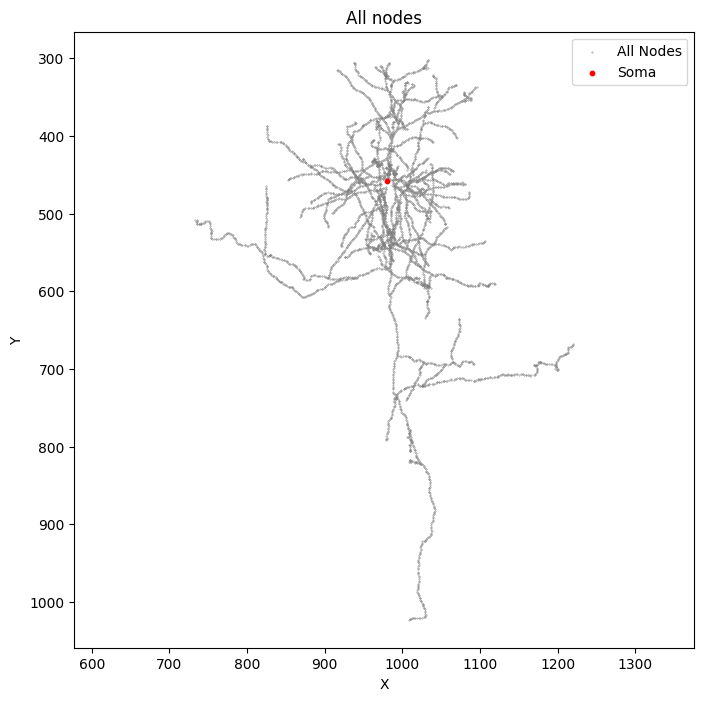

In [7]:
# Plot all nodes
plot_skeleton_nodes(sk_swc)

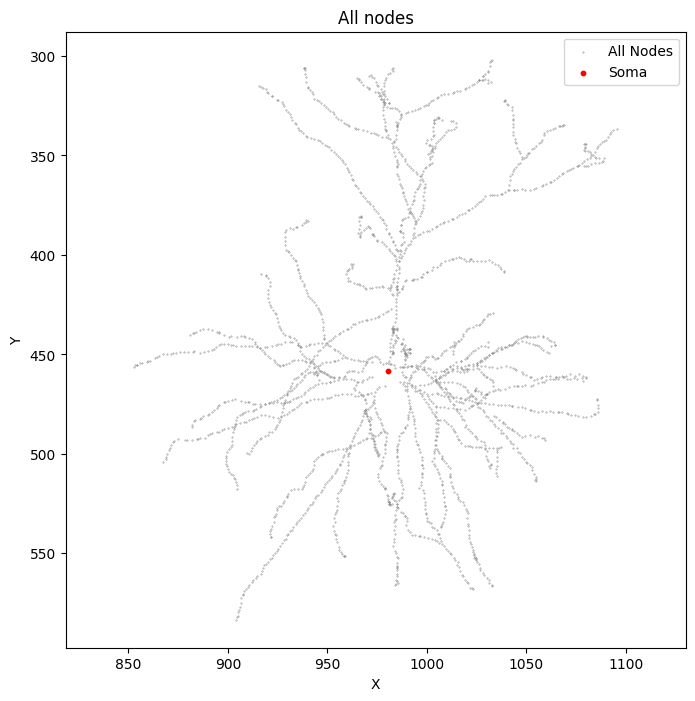

In [8]:
# plot only dendrites
mask = (sk_swc["type"] == 1) |(sk_swc["type"] == 3) | (sk_swc["type"] == 4) 
#mask = sk_swc["type"] == 2
sk_swc_dend = sk_swc[mask]

plot_skeleton_nodes(sk_swc_dend)

#### Preprocessing

Removes excessive nodes that is not part of dendrites

sk_swc format

* `id` : the node index
* `radius` : cable radius (um)
* `type` : 1: soma; 2: axon; 3: (basal) dendrite. Sometimes 4: apical dendrite (depending on skeleton version)
* `x`,`y`,`z` : node position in the volume (um)

In [9]:
# Filter out only dendrites
mask = (sk_swc["type"] == 1) |(sk_swc["type"] == 3) | (sk_swc["type"] == 4)
sk_swc_dend = sk_swc[mask]
sk_swc_dend

# Preprocessing
dir_name = "/media/imaging/DATA4/CK/python_script/MicronsBinder_03/results/skeleton/dendrite_nodecounts/"
sk_swc_dend_prec, branches = preproc_skeleton(sk_swc_dend, root_id, dir_name, save=False, stumps_threshold = 6)
sk_swc_dend_prec

NameError: name 'preproc_skeleton' is not defined

#### Dendrites order

In [736]:
# Centrifugal ordering
sk_swc_dend_levels = assign_centrifugal_levels(sk_swc_dend_prec)
sk_swc_dend_levels

,id,type,x,y,z,radius,parent,cf_level
0,0,1,980.352,458.176,958.88,5.976,-1,0
1,2743,3,981.424,448.464,958.16,0.804,0,1
2,2744,3,981.536,446.176,957.72,0.804,2743,1
3,2745,3,981.312,444.064,957.04,0.804,2744,1
4,2746,3,981.824,442.064,956.40,0.804,2745,1
...,...,...,...,...,...,...,...,...
2385,5206,3,988.488,448.104,1019.20,0.041,4250,5
2386,5207,3,987.264,448.384,1019.52,0.041,5206,5
2387,5208,3,989.704,449.640,1020.40,0.068,4250,5
2388,5209,3,991.528,447.440,1019.52,0.027,4250,5


In [737]:
# Branch ordering -> Note that you put input as sk_swc_dend_levels (with centrifugal ordering)
sk_swc_dend_levels_all = assign_branch_clusters(sk_swc_dend_levels)
sk_swc_dend_levels_all

,id,type,x,y,z,radius,parent,cf_level,br_level
0,0,1,980.352,458.176,958.88,5.976,-1,0,-1
1,2743,3,981.424,448.464,958.16,0.804,0,1,1
2,2744,3,981.536,446.176,957.72,0.804,2743,1,1
3,2745,3,981.312,444.064,957.04,0.804,2744,1,1
4,2746,3,981.824,442.064,956.40,0.804,2745,1,1
...,...,...,...,...,...,...,...,...,...
2385,5206,3,988.488,448.104,1019.20,0.041,4250,5,4
2386,5207,3,987.264,448.384,1019.52,0.041,5206,5,4
2387,5208,3,989.704,449.640,1020.40,0.068,4250,5,4
2388,5209,3,991.528,447.440,1019.52,0.027,4250,5,4


In [685]:
# Segment ordering
sk_swc_dend_levels_all = assign_segments_per_branch_level(sk_swc_dend_levels)
sk_swc_dend_levels_all

,id,type,x,y,z,radius,parent,cf_level,br_level,segment_id
0,0,1,692.352,445.120,847.36,6.509,-1,0,-1,1
1,2570,3,694.184,436.504,845.52,1.064,0,1,1,1
2,2571,3,694.224,434.152,845.60,1.064,2570,1,1,1
3,2572,3,694.400,432.296,845.92,1.382,2571,2,1,2
4,2573,3,693.400,429.968,847.72,0.942,2572,3,1,4
...,...,...,...,...,...,...,...,...,...,...
2303,5251,3,688.256,443.120,847.44,1.124,5250,2,3,3
2304,5252,3,696.976,436.176,847.64,0.064,0,1,7,1
2305,5253,3,696.208,435.176,848.40,0.064,5252,1,7,1
2306,5254,3,695.096,434.848,848.48,0.064,5253,1,7,1


In [470]:
""" For plotting, you have 3 different options:
    plot_skeleton_by_levels_2d(sk_swc_dend_levels, "br_level", "max")
    plot_skeleton_by_levels_3d(sk_swc_dend_levels, "br_level", "max")
    plot_skeleton_by_levels_3d_interactive(sk_swc_dend_levels, "br_level", "max") """

' For plotting, you have 3 different options:\n    plot_skeleton_by_levels_2d(sk_swc_dend_levels, "br_level", "max")\n    plot_skeleton_by_levels_3d(sk_swc_dend_levels, "br_level", "max")\n    plot_skeleton_by_levels_3d_interactive(sk_swc_dend_levels, "br_level", "max") '

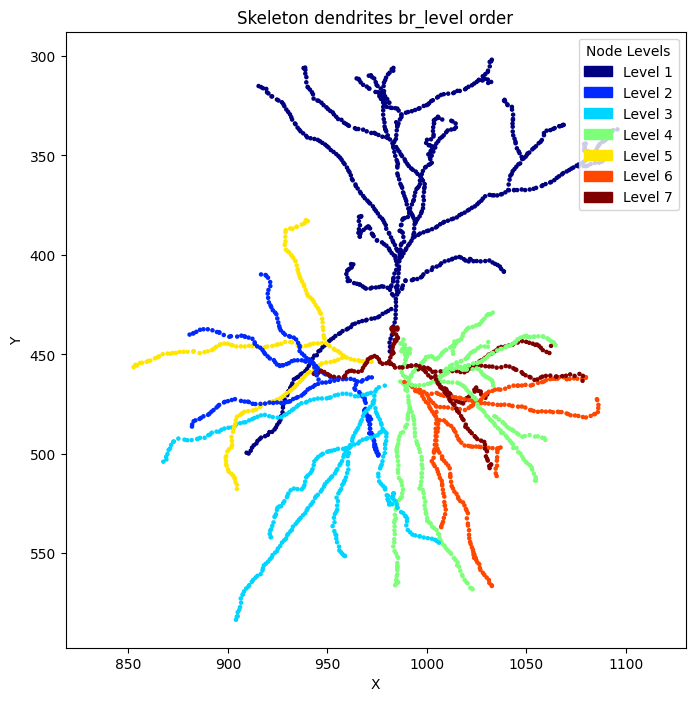

In [613]:
plot_skeleton_by_levels_2d(sk_swc_dend_levels_all, "br_level", "max", root_id, "--", False)

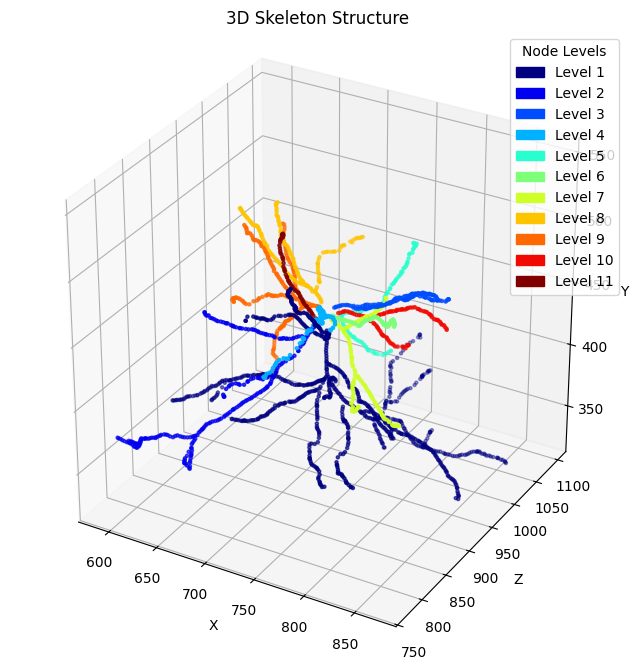

In [562]:
plot_skeleton_by_levels_3d(sk_swc_dend_levels_all, "br_level", "max")

In [738]:
dir_name = "/media/imaging/DATA4/CK/python_script/MicronsBinder_03/results/skeleton/"
plot_skeleton_by_levels_3d_interactive(sk_swc_dend_levels_all, "br_level", "max", root_id, "--", False)

In [347]:
sk_swc_dend_levels_all

,id,type,x,y,z,radius,parent,cf_level,br_level,segment_id
0,0,1,744.320,593.152,837.32,4.579,-1,0,-1,1
1,1,3,748.776,600.120,839.96,0.188,0,1,1,1
2,1248,3,747.736,596.800,840.12,1.762,1,1,1,1
3,1249,3,748.360,595.064,840.56,1.762,1248,1,1,1
4,1250,3,748.904,593.528,840.12,2.136,1249,2,1,2
...,...,...,...,...,...,...,...,...,...,...
1909,3884,3,737.272,589.600,839.80,1.232,3883,5,1,15
1910,3885,3,736.592,589.040,839.08,1.232,3884,5,1,15
1911,3886,3,735.992,588.440,838.28,1.232,3885,5,1,15
1912,3887,3,754.368,596.424,858.80,0.044,2383,3,1,6


#### Calculate distances to soma

In [348]:
sk_swc_dend_levels_all = compute_skeleton_tree_distances(sk_swc_dend_levels_all)
sk_swc_dend_levels_all

,id,type,x,y,z,radius,parent,cf_level,br_level,segment_id,distance_from_soma
0,0,1,744.320,593.152,837.32,4.579,-1,0,-1,1,0.000000
1,1,3,748.776,600.120,839.96,0.188,0,1,1,1,8.682083
2,1248,3,747.736,596.800,840.12,1.762,1,1,1,1,12.164840
3,1249,3,748.360,595.064,840.56,1.762,1248,1,1,1,14.061330
4,1250,3,748.904,593.528,840.12,2.136,1249,2,1,2,15.749178
...,...,...,...,...,...,...,...,...,...,...,...
1909,3884,3,737.272,589.600,839.80,1.232,3883,5,1,15,38.741180
1910,3885,3,736.592,589.040,839.08,1.232,3884,5,1,15,39.878897
1911,3886,3,735.992,588.440,838.28,1.232,3885,5,1,15,41.045087
1912,3887,3,754.368,596.424,858.80,0.044,2383,3,1,6,33.582268


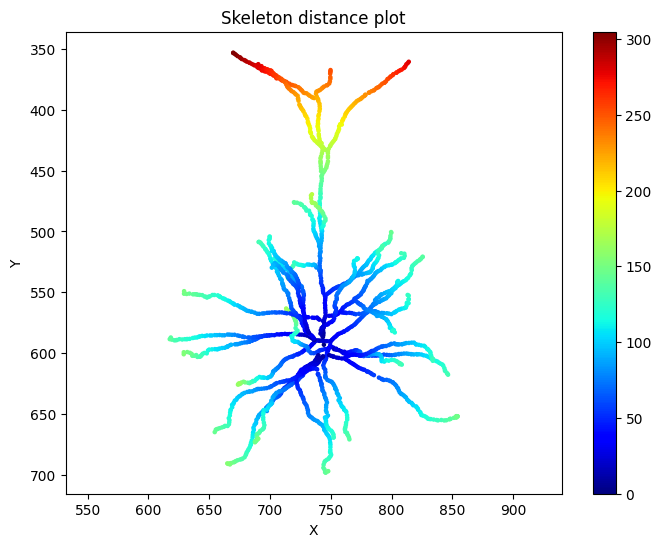

In [187]:
# Plot skeletons in regards from distance to soma
# From closest node to soma as red to black to blue as the farthest
plot_skeleton_distance_2d(sk_swc_dend_levels_all, root_id, dir_name, False, view = "xy")

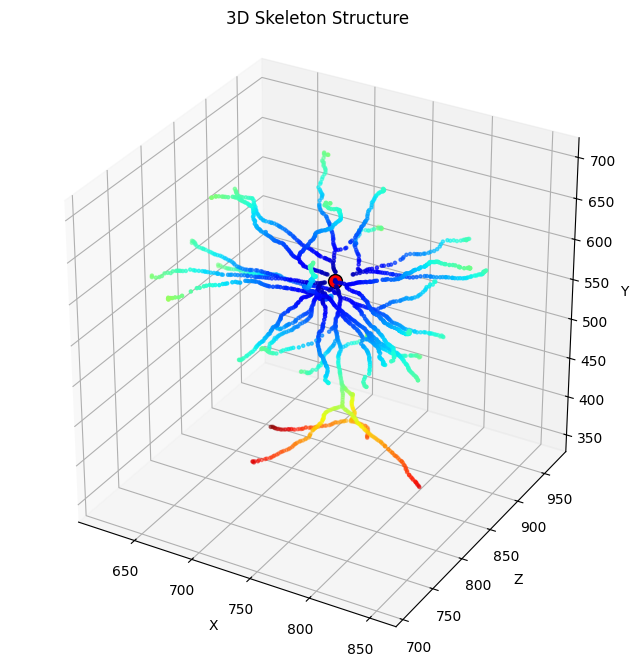

In [64]:
plot_skeleton_distance_3d(sk_swc_dend_levels_all)

In [208]:
plot_skeleton_distance_3d_interactive(sk_swc_dend_levels_all)

In [65]:
sk_swc_dend_levels_all

,id,type,x,y,z,radius,parent,cf_level,br_level,distance_from_soma
0,0,1,744.320,593.152,837.32,4.579,-1,0,-1,0.000000
1,1256,3,743.824,585.248,840.08,0.845,0,1,1,8.386706
2,1257,3,743.992,583.440,841.44,0.845,1256,1,1,10.655337
3,1258,3,743.688,581.736,842.00,0.845,1257,1,1,12.474576
4,1259,3,744.080,579.264,842.68,0.845,1258,1,1,15.068193
...,...,...,...,...,...,...,...,...,...,...
1883,3859,3,702.792,527.384,822.72,0.322,3858,4,3,92.498532
1884,3860,3,702.592,527.712,822.48,0.322,3859,4,3,92.951504
1885,3861,3,701.504,529.768,822.12,0.322,3860,4,3,95.305327
1886,3887,3,754.368,596.424,858.80,0.044,2383,2,4,24.529383


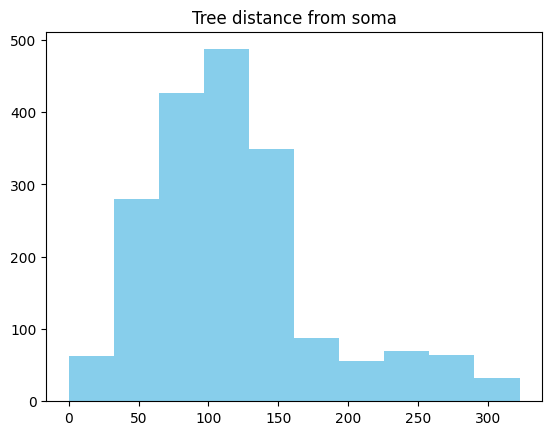

In [154]:
dist_all = sk_swc_dend_levels_all['distance_from_soma']
plt.hist(dist_all, color='skyblue')
plt.title("Tree distance from soma")
plt.show()

### Multiple neurons

#### Setup
Make sure you choose a correct set up neuron types and area


In [21]:
""" 
    Read tables and neuron lists
    MAKE SURE YOU CHOOSE CORRECT FILTER FOR SELECTING FOR FILTERING NEURONS
"""

dir_name = "/media/DATA1/microns/data_synapses/"

dend_extended_fname = "dend_extended_df"
dend_clean_fname = "dend_clean_df"
coregistration_manual_fname = "coregistration_manual_v4"
nucleus_detection_fname = "nucleus_detection_v0"
aibs_metamodel_celltypes_fname = "aibs_metamodel_celltypes_v661"
nucleus_functional_area_fname = "nucleus_functional_area_assignment"
functional_properties_fname = "functional_properties_v3_bcm"

dend_extended_df = pd.read_pickle(dir_name + dend_extended_fname)
dend_clean_df = pd.read_pickle(dir_name + dend_clean_fname)
coregistration_manual_v4 = pd.read_pickle(dir_name + coregistration_manual_fname)
nucleus_detection_v0 = pd.read_pickle(dir_name + nucleus_detection_fname)
aibs_metamodel_celltypes_v661 = pd.read_pickle(dir_name + aibs_metamodel_celltypes_fname)
nucleus_functional_area_assignment = pd.read_pickle(dir_name + nucleus_functional_area_fname)
functional_properties_v3_bcm = pd.read_pickle(dir_name + functional_properties_fname)

# get clean and extended version of dendrites proofreading
def remove_unhashable_columns(df):
    return df[[col for col in df.columns if df[col].apply(lambda x: not isinstance(x, (list, np.ndarray))).all()]]

# remove them
dend_clean_df_cleaned = remove_unhashable_columns(dend_clean_df)
dend_extended_df_cleaned = remove_unhashable_columns(dend_extended_df)

# Combine
dend_combined_df = pd.concat([dend_clean_df_cleaned, dend_extended_df_cleaned]).drop_duplicates().reset_index(drop=True)

# List of neurons
list_pt_root_id = pd.merge(dend_combined_df[['pt_root_id']], coregistration_manual_v4[['pt_root_id']],how='inner',on=['pt_root_id'])

# add single cell type (23P or 4P)
mask = aibs_metamodel_celltypes_v661['cell_type'] == '23P'
list_pt_root_id = pd.merge(list_pt_root_id, aibs_metamodel_celltypes_v661[mask][['pt_root_id']], how='inner', on=['pt_root_id'])

# # add V5 cell type
# mask = aibs_metamodel_celltypes_v661['cell_type'].isin(['5P-IT', '5P-ET', '5P-NP'])
# list_pt_root_id = pd.merge(list_pt_root_id, aibs_metamodel_celltypes_v661[mask][['pt_root_id']], how='inner', on=['pt_root_id'])

mask = nucleus_functional_area_assignment['tag'] == 'V1'
list_pt_root_id = pd.merge(list_pt_root_id, nucleus_functional_area_assignment[mask][['pt_root_id']], how='inner', on=['pt_root_id'])

# Check its functional properties are known and the neuron has a good selectivity (large gOSI)
mask = functional_properties_v3_bcm['gOSI'] != None
list_pt_root_id= pd.merge(list_pt_root_id['pt_root_id'], functional_properties_v3_bcm[mask]['pt_root_id'], how='inner', on=['pt_root_id'])

list_uniq_root_id = list_pt_root_id.pt_root_id.unique()
list_uniq_root_id = pd.DataFrame({'pt_root_id': list_uniq_root_id})

print(f"Total neurons selected: {len(list_pt_root_id)}")
print(f"Number of unique neurons: {len(list_uniq_root_id)} \n")
list_uniq_root_id

Total neurons selected: 432
Number of unique neurons: 222 



,pt_root_id
0,864691136228491601
1,864691136663700958
2,864691136330407914
3,864691135953669667
4,864691135492023271
...,...
217,864691136239013948
218,864691136135963787
219,864691135408808649
220,864691135741721707


#### Save skeleton

Save raw swc files: saving all raw skeleton files
Because they're error-prone with all neurons looping through, run in batches

In [31]:
""" Prepare list of batches """

# Convert list_uniq_root_id into list for Batch processing
list_uniq_root_id_list = list_uniq_root_id['pt_root_id'].tolist()

# Split into chunks of 15 neurons each
# using list comprehension will append all the chunks together.
# This will seperate data into 15 neurons each and save them in neuron_chunks altogether
chunk_size = 15
neuron_chunks = [list_uniq_root_id_list[i:i + chunk_size] for i in range(0, len(list_uniq_root_id_list), chunk_size)]

# create labels for each chunk ex) list_uniq_neurons_01, list_uniq_neurons_02, ...  
chunk_labels = [f"list_uniq_neurons_{str(i+1).zfill(2)}" for i in range(len(neuron_chunks))]

In [32]:
# Batch processing test
for chunk_index, chunk in enumerate(neuron_chunks):
    chunk_label = chunk_labels[chunk_index]
    
    print(f"Processing {chunk_label}...")

    for root_id in chunk:
        print(root_id)

Processing list_uniq_neurons_01...
864691136228491601
864691136663700958
864691136330407914
864691135953669667
864691135492023271
864691135570523014
864691136090670903
864691135473346354
864691135970226021
864691135234387801
864691135816765775
864691135786731972
864691135993150913
864691136195419606
864691135342593457
Processing list_uniq_neurons_02...
864691135731649465
864691135539486066
864691136389875831
864691135756145106
864691135388024449
864691135473477426
864691136195818828
864691135868118038
864691136579091988
864691135867009413
864691136239081532
864691135868131350
864691135469753426
864691136090602551
864691135572654885
Processing list_uniq_neurons_03...
864691135700799778
864691136619850381
864691135257638831
864691137198691137
864691135778212448
864691135464128062
864691135105563469
864691135304641703
864691135473343538
864691136195437526
864691135808719133
864691136391756671
864691136090561847
864691135911348649
864691136484208172
Processing list_uniq_neurons_04...
86469

In [ ]:
""" Saving raw skeleton data - not preprocessed"""
# Saving raw skeleton data - instead of preprocessed on T0T
# Count nodes within certain radius
dir_save_raw = "/media/DATA1/CK/python_script/MicronsBinder_03/results/skeleton/skeleton_swc_data/skeleton_swc_raw/"

start_chunk_index = 1  # Change this to the failed chunk index (e.g., 1 for chunk 2)
branch_node_count = []
for chunk_index in range(start_chunk_index, len(neuron_chunks)):  # Start from failed chunk
    chunk_label = chunk_labels[chunk_index]
    
    print(f"Processing {chunk_label} (Chunk {chunk_index+1})...")

    for root_id in neuron_chunks[chunk_index]:
        try:
            # Load skeleton
            sk_swc = client.skeleton.get_skeleton(root_id, output_format='swc', skeleton_version=2)

            # Select dendrites only
            mask = (sk_swc["type"] == 1) |(sk_swc["type"] == 3) | (sk_swc["type"] == 4)
            sk_swc_dend = sk_swc[mask]
            
            # Save skeleton
            file_name = f"{root_id}_sk_swc_raw.csv"
            sk_swc_dend.to_csv(dir_save_raw + file_name)
        
        except Exception as e:
            print(f"Error processing neuron {root_id}: {e}")

#### Skeleton sanity check
1) Count number of nodes within certain radius
2) Count number of nodes per each dendrite branch domain

In [ ]:
""" Counting number of nodes within certain radius """

dir_save_raw = "/media/imaging/DATA4/CK/python_script/MicronsBinder_03/results/skeleton/skeleton_swc_data/skeleton_swc_raw/4P_V1/"

soma_dist_all_neurons = {}

for neuron in list_uniq_root_id_list:
#for neuron in list_uniq_root_id_list_tmp:
    soma_dist_per_neuron = []
    
    file_name = f"{neuron}_sk_swc_raw.csv"
    swc_dend = pd.read_csv(dir_save_raw + file_name)


    # Calculate distance to soma first
    sk_swc_dend_levels_all = soma_euclidean_dist(swc_dend, root_id)

    
    # Calculate euclidean distace (NOT TREE DISTNACE!)
    for soma_rad in range(1,20):
        mask = sk_swc_dend_levels_all["eucli_dist"] <= soma_rad
        sk_swc_dend_levels_dist = sk_swc_dend_levels_all[mask]

        soma_dist_per_neuron.append(len(sk_swc_dend_levels_dist) - 1)  # It's because soma always counts as one node within

    soma_dist_all_neurons[neuron] = soma_dist_per_neuron

In [ ]:
# Have a lookt at the dataframe
pd.set_option('display.max.rows',223)  
dist_all_df = pd.DataFrame.from_dict(soma_dist_all_neurons)
dist_all_df = dist_all_df.T
dist_all_df

In [ ]:
# Visualization - First neuron and average of them
dist_all = np.array(list(soma_dist_all_neurons.values()))   # Take only values from dist_all dictionary 
dist_all_avg = np.mean(dist_all, axis = 0)

plt.figure(figsize=(8,6))
plt.plot(dist_all_avg)
plt.plot(dist_all[0])
plt.ylabel('Node Count')
plt.xlabel('Radius (um)')
plt.title("4P Layer")
plt.show()

In [ ]:
# Visualization - Plot all the individual neurons and average of them
dist_all = np.array(list(soma_dist_all_neurons.values()))   # Take only values from dist_all dictionary 
dist_all_avg = np.mean(dist_all, axis = 0)

plt.figure(figsize=(8, 6))

for row in dist_all:
    plt.plot(row, color='gray')
    
plt.plot(dist_all_avg, color = 'blue')
plt.ylabel('Node Count')
plt.xlabel('Radius (um)')
plt.title("4P Layer")
plt.show()

In [ ]:
""" 
    Skeleton Sanity Check: Check nodes morphology in 3D visualization:
    (This is to quickly check if there are nodes around soma are oddly shaped, and to check if there are any stumps)
"""

# Choose neuron_id <============== CHANGE THIS
root_id = 864691137198691137

# Load existing skeleton
sk_swc = client.skeleton.get_skeleton(root_id, 
                                      output_format='swc', 
                                      skeleton_version=2)

# plot only dendrites
mask = (sk_swc["type"] == 1) |(sk_swc["type"] == 3) | (sk_swc["type"] == 4) 
sk_swc_dend = sk_swc[mask]

sk_swc_dend_prec = sk_swc_dend

# Centrifugal ordering
sk_swc_dend_levels = assign_centrifugal_levels(sk_swc_dend_prec)
sk_swc_dend_levels

# Branch ordering -> Note that you put input as sk_swc_dend_levels (with centrifugal ordering)
sk_swc_dend_levels_all = assign_branch_clusters(sk_swc_dend_levels)
sk_swc_dend_levels_all

dir_name = "/media/imaging/DATA4/CK/python_script/MicronsBinder_03/results/skeleton/"
plot_skeleton_by_levels_3d_interactive(sk_swc_dend_levels_all, "br_level", "max", root_id, "--", False)

#### Save preprocessed skeleton
This process goes through preprocessing of removing nodes under certain radius and
then proceeds to cluster dendrties by branch, centrifugal, segments, and soma_distance

In [ ]:
""" 
    Here we create files for each neuron: skeleton file, ordering (branch, centri, seg, soma_dis)
    
        1) Save skeleton files including levels - sk_swc_dend_levels_all
    
        2) Save PNG files for ordering - branch, centrifugal, segments level, soma_distance
        
        3) Additionally, to validate stumps_removal, here you go through preprocessing and ordering, 
        calculate and save the plot histogram of node counts. (after validation, you can remove branches count)
"""

dir_save_name = "/media/imaging/DATA4/CK/python_script/MicronsBinder_03/results/skeleton/skeleton_swc_data/"
dir_name_val = "/media/imaging/DATA4/CK/python_script/MicronsBinder_03/results/skeleton/skeleton_validation/"
dir_name_sk = "/media/imaging/DATA4/CK/python_script/MicronsBinder_03/results/skeleton/skeleton_validation/preprocessing/"

# Set the starting chunk index (0-based index)
# start_chuck_index was added because it keeps failing at one point during the loop, and in order to restart from
# where it failed, we create batches and start from there
#start_chunk_index = 1  # Change this to the failed chunk index (e.g., 1 for chunk 2)
branch_node_count = []
for chunk_index in range(start_chunk_index, len(neuron_chunks)):  # Start from failed chunk
    chunk_label = chunk_labels[chunk_index]
    
    print(f"Processing {chunk_label} (Chunk {chunk_index+1})...")

    for root_id in neuron_chunks[chunk_index]:
        try:
            # Load skeleton
            sk_swc = client.skeleton.get_skeleton(root_id, output_format='swc', skeleton_version=2)
            
            # Select Dendrites only
            mask = (sk_swc["type"] == 1) | (sk_swc["type"] == 3) | (sk_swc["type"] == 4)  # Keep dendrites
            sk_swc_dend = sk_swc[mask]

            # Preprocessing
            sk_swc_dend_prec, branches = preproc_skeleton(sk_swc_dend, root_id, dir_name_sk, save=True, stumps_threshold=6)
            branches_np = np.array(list(branches))
            branch_node_count.append(branches_np)

            # Dendrite ordering
            sk_swc_dend_levels = assign_centrifugal_levels(sk_swc_dend_prec)
            sk_swc_dend_levels_all = assign_branch_clusters(sk_swc_dend_levels)
            sk_swc_dend_levels_all = assign_segments_per_branch_level(sk_swc_dend_levels_all)
            sk_swc_dend_levels_all = compute_skeleton_tree_distances(sk_swc_dend_levels_all)

            # Save skeleton
            file_name = f"{root_id}_sk_swc.csv"
            sk_swc_dend_levels_all.to_csv(dir_save_name + file_name)

            # Save PNG visualizations
            plot_skeleton_by_levels_2d(sk_swc_dend_levels_all, "br_level", "max", root_id, dir_name_val, True)
            plot_skeleton_by_levels_2d(sk_swc_dend_levels_all, "cf_level", "max", root_id, dir_name_val, True)
            plot_skeleton_by_levels_2d(sk_swc_dend_levels_all, "segment_id", "max", root_id, dir_name_val, True)

            plot_skeleton_by_levels_3d_interactive(sk_swc_dend_levels_all, "br_level", "max", root_id, dir_name_val, True)
            plot_skeleton_by_levels_3d_interactive(sk_swc_dend_levels_all, "cf_level", "max", root_id, dir_name_val, True)
            plot_skeleton_by_levels_3d_interactive(sk_swc_dend_levels_all, "segment_id", "max", root_id, dir_name_val, True)

            plot_skeleton_distance_2d(sk_swc_dend_levels_all, root_id, dir_name_val, True, view="xy")
            plot_skeleton_distance_3d_interactive(sk_swc_dend_levels_all, root_id, dir_name_val, True)

        except Exception as e:
            print(f"Error processing neuron {root_id}: {e}")

print("Processing complete.")

############## Save dataframe of branch node counts #################################
branch_node_count_df = pd.DataFrame(branch_node_count_np)
branch_node_count_df.to_csv("/media/imaging/DATA4/CK/python_script/MicronsBinder_03/results/skeleton/skeleton_validation/preprocessing/branch_node_count_df.csv")

In [ ]:
# Plot Branch node counts
branch_node_count = pd.read_pickle("/media/imaging/DATA4/CK/python_script/MicronsBinder_03/results/skeleton/skeleton_validation/preprocessing/branch_node_count_df.csv")
branch_node_count_np = np.concatenate(branch_node_count)

plt.hist(branch_node_count_np, color="skyblue", edgecolor="grey")
plt.xlabel("Total branch node count")
plt.ylabel("Frequency")
plt.title("Branch node counts")

# fname = "dendrite_nodecounts_all.png"
# plt.savefig(dir_name_sk + fname, dpi=300, format='png')
# plt.close()

# print(f"Dendrite histogram saved: {dir_name_sk + fname}")

In [ ]:
# Plot Branch node counts from 0 to 100
plt.figure(figsize=(8, 5))
plt.hist(branch_node_count_np, bins=np.arange(0,100,1), color="skyblue", edgecolor="grey")
plt.xlabel("Nodes per branch")
plt.title("Branch Node Counts")

## Synapse skeleton assignment

### Single neuron

#### Check distances between each nodes

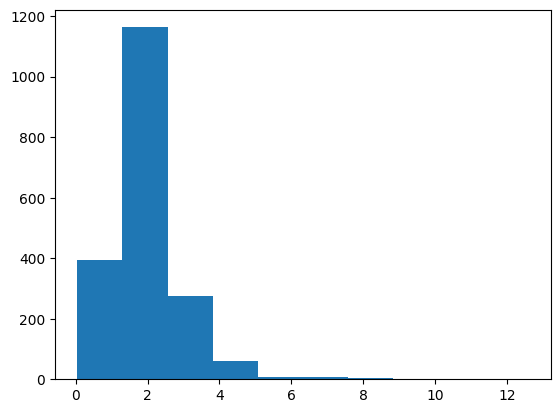

In [155]:
# Just to see how close are each synapses to their assigned skeletons
distance_bt_nodes = distance_bt_skeleton_nodes(sk_swc_dend_levels_all)
plt.hist(distance_bt_nodes)
plt.show()

#### Assign synapses

In [68]:
# Assign to single synapse : Calculate and save
root_id = root_id
dir_name = "/media/imaging/DATA4/CK/python_script/MicronsBinder_03/results/skeleton/synapse_assignments/"
assignments_df = synapse_to_skeleton(root_id, dir_name)

In [157]:
# Read file of single assigned synapse table
# Here synapse_id is the soma_id of that presynaptic neuron
# node_id is the skeleton nodes
dir_name = "/media/imaging/DATA4/CK/python_script/MicronsBinder_03/results/skeleton/synapse_assignments/V1_4P/"
file_name = f"{root_id}_syn_assignment.csv"
assignments_df = pd.read_csv(dir_name + file_name)
assignments_df

,Unnamed: 0,synapse_id,node_id,distance
0,0,864691136750360942,2963.0,2.887213
1,1,864691135510427844,3838.0,3.244747
2,2,864691135702167189,1360.0,0.655902
3,3,864691135208439820,3047.0,6.299318
4,4,864691135629670508,2455.0,3.380073
...,...,...,...,...
4126,4126,864691135617551721,3367.0,1.731071
4127,4127,864691136390205456,3702.0,2.900781
4128,4128,864691135890904969,2449.0,0.755142
4129,4129,864691136335381171,3166.0,2.577316


In [158]:
# Merge assignments_id and sk_swc_dend_levels_all: single neuron

# Ensure node_id in assignments_df is converted to integer to match id in sk_swc_dend_levels_all
assignments_df['node_id'] = assignments_df['node_id'].astype(int)

# Merge dataframes based on the matching column (inner join keeps only overlapping values)
merged_df = assignments_df.merge(sk_swc_dend_levels_all, left_on='node_id', right_on='id', how='inner')

# Display or save the result
dir_name = "/media/imaging/DATA4/CK/python_script/MicronsBinder_03/results/skeleton/synapse_skeleton_table_total/"

file_name = f"{root_id}_synapse_skeleton_table.csv"
#merged_df.to_csv(dir_name + file_name, index=False)  # Optional: Save to a file
merged_df

,Unnamed: 0,synapse_id,node_id,distance,id,type,x,y,z,radius,parent,cf_level,br_level,segment_id,distance_from_soma
0,0,864691136750360942,2963,2.887213,2963,3,731.320,613.560,862.20,0.348,2962,3,3,4,39.281925
1,1,864691135510427844,3838,3.244747,3838,3,723.072,548.560,839.04,0.322,3280,8,1,41,82.612461
2,2,864691135702167189,1360,0.655902,1360,3,739.488,391.592,875.84,0.354,1359,10,1,50,235.056366
3,3,864691135208439820,3047,6.299318,3047,3,748.768,601.728,829.24,0.428,0,1,4,1,12.594399
4,4,864691135629670508,2455,3.380073,2455,3,703.800,566.536,851.24,0.362,2454,4,1,19,83.783985
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4126,4126,864691135617551721,3367,1.731071,3367,3,744.792,689.688,825.20,0.361,3366,2,2,3,131.153172
4127,4127,864691136390205456,3702,2.900781,3702,3,796.808,573.792,876.48,0.353,3701,7,1,37,116.107320
4128,4128,864691135890904969,2449,0.755142,2449,3,716.408,567.376,851.88,0.362,2448,4,1,19,70.952957
4129,4129,864691136335381171,3166,2.577316,3166,3,757.688,565.896,845.28,0.432,3165,6,1,28,56.498885


#### Hypothesis 1: Soma distance threshold

In [159]:
# Refine pre_func_table by calculating mean pref_ori of neurons with multiple pref_ori
######################## WRONGGGGGG ##############################
def circular_mean(angles):
    """
        Compute the circular mean of multiple angles (radians)
        input: list of radians
        output: average of them
    """
    angles = np.asarray(angles) # ensure input is a numpy array
    mean_angle = np.arctan2(np.mean(np.sin(angles)), np.mean(np.cos(angles)))

    # Ensure result is in the range [0, pi]
    return mean_angle % np.pi

In [160]:
""" Single neuron """

############# Bring functional synapses, root_func_table and pre_func_table is what's important ############ 

# Query presynaptic information of our selected neuron & Query functional table
pre_synapse_df = client.materialize.synapse_query(post_ids=root_id)
functional_properties_v3_bcm = client.materialize.tables.functional_properties_v3_bcm().query()

# Get the postsynaptic neuron's functional property (single table)
root_func_table = functional_properties_v3_bcm[functional_properties_v3_bcm['pt_root_id']==root_id]

# Find our presynapses's functional properties
mask = functional_properties_v3_bcm['pt_root_id'].isin(pre_synapse_df['pre_pt_root_id'])
pre_func_table =  functional_properties_v3_bcm[mask]

The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


In [161]:
# Group duplicated neurons so that each neuron has their mutiple orientations
# Apply circular_mean to EACH GROUP so that each neuron has an averaged pref_ori value
pref_ori_avg = pre_func_table.groupby('pt_root_id')['pref_ori'].apply(circular_mean)

# Add column of averaged pref_ori at the end of the table by using merge
pref_func_table_avg = pre_func_table.merge(pref_ori_avg.rename('pref_ori_avg'), on='pt_root_id', how = 'left')
pref_func_table_avg

,id,created,valid,volume,pt_supervoxel_id,pt_root_id,id_ref,created_ref,valid_ref,target_id,...,unit_id,pref_ori,pref_dir,gOSI,gDSI,cc_abs,pt_position,bb_start_position,bb_end_position,pref_ori_avg
0,192545,2020-09-28 22:41:46.355112+00:00,t,252.172042,85017950515766963,864691136125411622,8771,2024-01-22 08:09:51.497934+00:00,t,192545,...,4673,2.950422,2.950422,0.522109,0.134369,0.725609,"[147040, 154048, 19794]","[nan, nan, nan]","[nan, nan, nan]",2.950422
1,224670,2020-09-28 22:45:01.205827+00:00,t,308.722074,86985252232293985,864691135383491034,3771,2024-01-22 08:09:51.497934+00:00,t,224670,...,2128,0.709299,3.850892,0.071477,0.191256,0.305324,"[161328, 131680, 23563]","[nan, nan, nan]","[nan, nan, nan]",0.709299
2,228099,2020-09-28 22:44:32.151249+00:00,t,259.953623,86004006421349214,864691135884460656,8793,2024-01-22 08:09:51.497934+00:00,t,228099,...,2516,2.829932,2.829932,0.384284,0.296552,0.380057,"[154160, 160768, 20522]","[nan, nan, nan]","[nan, nan, nan]",2.829932
3,256610,2020-09-28 22:44:47.951377+00:00,t,284.420014,88249896561494434,864691135105563469,1386,2024-01-22 08:09:51.497934+00:00,t,256610,...,1985,0.002509,3.144102,0.328739,0.024733,0.464110,"[170864, 116832, 22166]","[nan, nan, nan]","[nan, nan, nan]",0.141409
4,256610,2020-09-28 22:44:47.951377+00:00,t,284.420014,88249896561494434,864691135105563469,5171,2024-01-22 08:09:51.497934+00:00,t,256610,...,2309,0.280309,3.421902,0.340308,0.075932,0.242544,"[170864, 116832, 22166]","[nan, nan, nan]","[nan, nan, nan]",0.141409
5,260443,2020-09-28 22:44:20.866580+00:00,t,243.078758,88887956634402694,864691135368813817,11850,2024-01-22 08:09:51.497934+00:00,t,260443,...,4583,2.760902,2.760902,0.196044,0.234520,0.076634,"[175280, 151904, 19981]","[nan, nan, nan]","[nan, nan, nan]",2.760902
6,258316,2020-09-28 22:45:07.748019+00:00,t,322.901115,89167988636844004,864691135941276838,3022,2024-01-22 08:09:51.497934+00:00,t,258316,...,3934,2.308462,2.308462,0.267428,0.029361,0.671840,"[177680, 141296, 21464]","[nan, nan, nan]","[nan, nan, nan]",2.236435
7,258316,2020-09-28 22:45:07.748019+00:00,t,322.901115,89167988636844004,864691135941276838,5318,2024-01-22 08:09:51.497934+00:00,t,258316,...,4267,2.164409,5.306002,0.151128,0.132603,0.703289,"[177680, 141296, 21464]","[nan, nan, nan]","[nan, nan, nan]",2.236435
8,260706,2020-09-28 22:41:04.665245+00:00,t,277.220884,88535494707130636,864691135688704736,3953,2024-01-22 08:09:51.497934+00:00,t,260706,...,4419,1.249048,1.249048,0.113561,0.088190,0.678691,"[172624, 147408, 22420]","[nan, nan, nan]","[nan, nan, nan]",1.249048
9,260825,2020-09-28 22:44:59.113912+00:00,t,303.802286,88817382134534029,864691135697538714,8045,2024-01-22 08:09:51.497934+00:00,t,260825,...,4812,1.209749,4.351342,0.055836,0.157128,0.445100,"[175024, 150576, 23130]","[nan, nan, nan]","[nan, nan, nan]",1.209749


In [162]:
# Check all the tables
print(f"Total Skeleton Nodes = {len(sk_swc_dend_levels_all)}")
print(f"Total Synapses = {len(assignments_df)}")
print(f"Total Assigned Synapse = {len(assignments_df['node_id'].unique())}")
print(f"Total Assigned Synapses w Functional properties = {len(pre_func_table['pt_root_id'].unique())}")

Total Skeleton Nodes = 1914
Total Synapses = 4131
Total Assigned Synapse = 1651
Total Assigned Synapses w Functional properties = 46


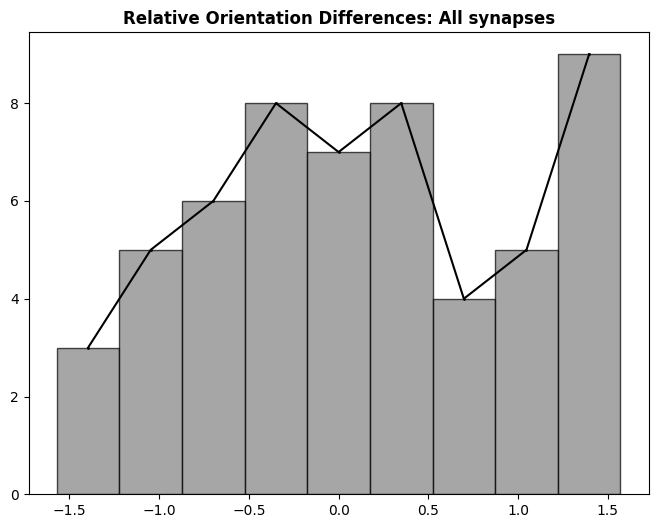

In [163]:
# Extract post and pre-synaptic preferred orientations
post_ori = root_func_table["pref_ori"].values  # Postsynaptic neuron orientations
pre_ori = pref_func_table_avg["pref_ori_avg"].values  # Presynaptic neuron orientations

# Compute relative orientation difference
relative_ori = pre_ori - post_ori

#Compute wrapped relative orientation
relative_ori_wrapped = (relative_ori + np.pi/2) % np.pi - np.pi/2

# Plot histogram
fig, ax = plt.subplots(figsize = (8, 6))
counts, bin_edges, _ = ax.hist(relative_ori_wrapped, bins=9, range=(-np.pi/2, np.pi/2), color = "gray", alpha=0.7, edgecolor='k')

# # Plot dots on peaks
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2   # Center of each bin
ax.scatter(bin_centers, counts, color = "k", s = 1)  # Plot scatter plot
ax.plot(bin_centers, counts, color = "k", linestyle = '-')

plt.title("Relative Orientation Differences: All synapses", fontweight = "bold")
plt.show()

In [164]:
# Now let's divide sk_swc_dend_levels_all in two groups
# nodes that are within +50 microns / those that are not

threshold = 40.0

mask_close = sk_swc_dend_levels_all['distance_from_soma'] <= threshold
sk_swc_dend_soma = sk_swc_dend_levels_all[mask_close]

mask_far = sk_swc_dend_levels_all['distance_from_soma'] > threshold
sk_swc_dend_soma_far = sk_swc_dend_levels_all[mask_far]

# Perform inner merge to keep only overlapping rows
merged_close = assignments_df.merge(sk_swc_dend_soma, left_on="node_id", right_on="id", how="inner")
merged_far = assignments_df.merge(sk_swc_dend_soma_far, left_on="node_id", right_on="id", how="inner")

# Select only the synapse_id column
filtered_synapse_close = merged_close[['synapse_id']]
filtered_synapse_far = merged_far[['synapse_id']]

mask_close = pref_func_table_avg['pt_root_id'].isin(filtered_synapse_close['synapse_id'])
pref_func_table_close = pref_func_table_avg[mask_close]

mask_far = pref_func_table_avg['pt_root_id'].isin(filtered_synapse_far['synapse_id'])
pref_func_table_far = pref_func_table_avg[mask_far]

# Remove duplicates based on 'pt_root_id' to ensure uniqueness in pref_func_table_close
pref_func_table_close_unique = pref_func_table_close.drop_duplicates(subset=['pt_root_id'])
pref_func_table_far_unique = pref_func_table_far.drop_duplicates(subset=['pt_root_id'])

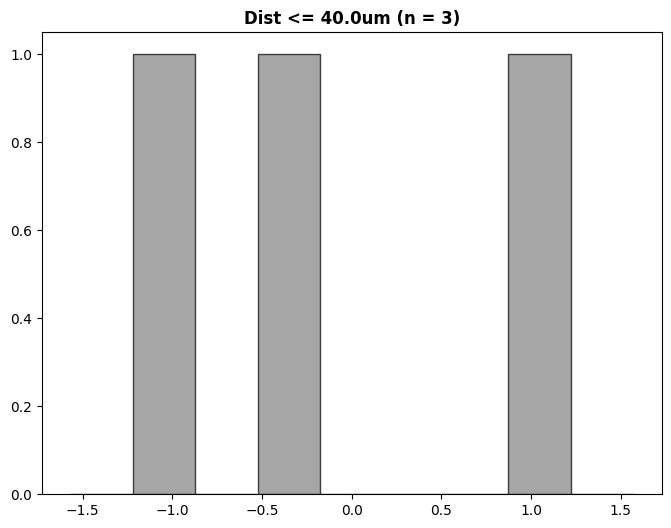

In [165]:
""" Plot relative orientation of closeby synapses """

post_ori = root_func_table["pref_ori"].values  # Postsynaptic neuron orientations
pref_ori = pref_func_table_close_unique["pref_ori_avg"].values  # Presynaptic neuron orientations]

# relative orientation
relative_ori = pref_ori - post_ori

# Compute wrapped relative orientation
relative_ori_wrapped = (relative_ori + np.pi/2) % np.pi - np.pi/2

# Plot histogram
fig, ax = plt.subplots(figsize = (8, 6))
counts, bin_edges, _ = ax.hist(relative_ori_wrapped, bins=9, range=(-np.pi/2, np.pi/2), color = "gray", alpha=0.7, edgecolor='k')


# # Plot dots on peaks
# bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2   # Center of each bin
# ax.scatter(bin_centers, counts, color = "k", s = 1)  # Plot scatter plot
# ax.plot(bin_centers, counts, color = "k", linestyle = '-')

plt.title(f"Dist <= {threshold}um (n = {len(pref_ori)})", fontweight = 'bold')
plt.show()

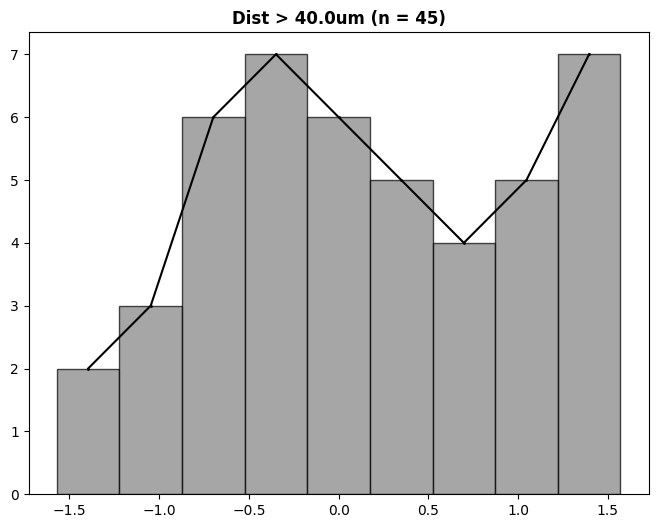

In [166]:
""" Plot relative orientation of far away synapses """

post_ori = root_func_table["pref_ori"].values  # Postsynaptic neuron orientations
pref_ori = pref_func_table_far_unique["pref_ori_avg"].values  # Presynaptic neuron orientations]

# relative orientation
relative_ori = pref_ori - post_ori

# Compute wrapped relative orientation
relative_ori_wrapped = (relative_ori + np.pi/2) % np.pi - np.pi/2

# Plot histogram
fig, ax = plt.subplots(figsize = (8, 6))
counts, bin_edges, _ = ax.hist(relative_ori_wrapped, bins=9, range=(-np.pi/2, np.pi/2), color = "gray", alpha=0.7, edgecolor='k')


# Plot dots on peaks
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2   # Center of each bin
ax.scatter(bin_centers, counts, color = "k", s = 1)  # Plot scatter plot
ax.plot(bin_centers, counts, color = "k", linestyle = '-')

plt.title(f"Dist > {threshold}um (n = {len(pref_ori)})", fontweight = 'bold')
plt.show()

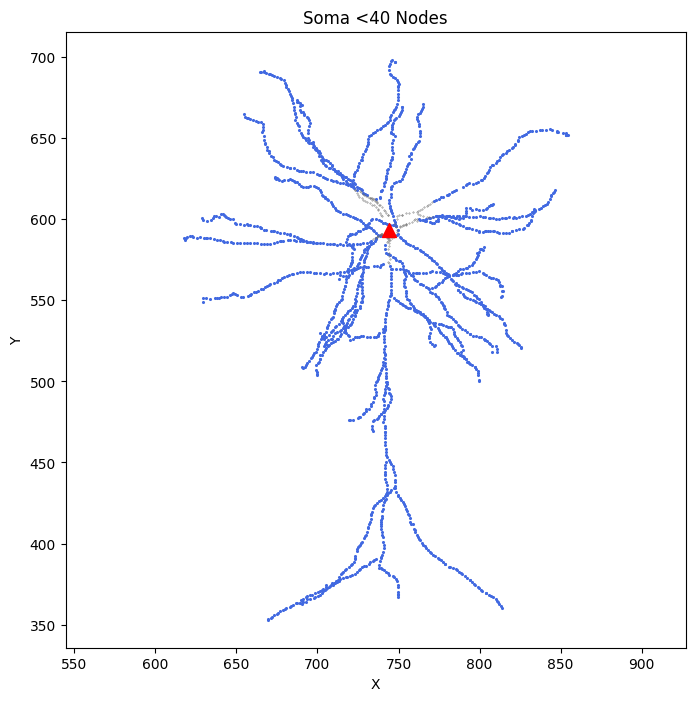

In [172]:
def plot_skeleton_nodes_dist(sk_swc, distance_threshold):
    plt.figure(figsize=(8, 8))
    
    # Mask for nodes within threshold
    mask_near_soma = sk_swc['distance_from_soma'] < distance_threshold
    mask_far_soma = ~mask_near_soma  # Nodes outside threshold
    
    # Plot nodes based on distance
    plt.scatter(sk_swc.loc[mask_far_soma, 'x'], sk_swc.loc[mask_far_soma, 'y'], 
                color='royalblue', label='All Nodes (Far)', s=1.5)
    plt.scatter(sk_swc.loc[mask_near_soma, 'x'], sk_swc.loc[mask_near_soma, 'y'], 
                color='dimgray', label=f'Nodes < {distance_threshold}', s=0.1)
    
    # Plot soma
    mask_soma = sk_swc["parent"] == -1
    soma_df = sk_swc[mask_soma]
    plt.scatter(soma_df["x"], soma_df["y"], color="red", marker = "^", s=100, label="Soma")
    
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.title(f'Soma <{distance_threshold} Nodes')
    #plt.legend()
    
    plt.axis('equal')
    plt.autoscale()
    plt.show()
    
plot_skeleton_nodes_dist(sk_swc_dend_levels_all, 40)    

### Multiple neurons

#### Read tables and neuron lists

In [81]:
""" 
    Read tables and neuron lists
    MAKE SURE YOU CHOOSE CORRECT FILTER FOR SELECTING FOR FILTERING NEURONS
"""

dir_name = "/media/imaging/DATA4/CK/microns/data_synapses/"

dend_extended_fname = "dend_extended_df"
dend_clean_fname = "dend_clean_df"
coregistration_manual_fname = "coregistration_manual_v4"
nucleus_detection_fname = "nucleus_detection_v0"
aibs_metamodel_celltypes_fname = "aibs_metamodel_celltypes_v661"
nucleus_functional_area_fname = "nucleus_functional_area_assignment"
functional_properties_fname = "functional_properties_v3_bcm"

dend_extended_df = pd.read_pickle(dir_name + dend_extended_fname)
dend_clean_df = pd.read_pickle(dir_name + dend_clean_fname)
coregistration_manual_v4 = pd.read_pickle(dir_name + coregistration_manual_fname)
nucleus_detection_v0 = pd.read_pickle(dir_name + nucleus_detection_fname)
aibs_metamodel_celltypes_v661 = pd.read_pickle(dir_name + aibs_metamodel_celltypes_fname)
nucleus_functional_area_assignment = pd.read_pickle(dir_name + nucleus_functional_area_fname)
functional_properties_v3_bcm = pd.read_pickle(dir_name + functional_properties_fname)

# get clean and extended version of dendrites proofreading
def remove_unhashable_columns(df):
    return df[[col for col in df.columns if df[col].apply(lambda x: not isinstance(x, (list, np.ndarray))).all()]]

# remove them
dend_clean_df_cleaned = remove_unhashable_columns(dend_clean_df)
dend_extended_df_cleaned = remove_unhashable_columns(dend_extended_df)

# Combine
dend_combined_df = pd.concat([dend_clean_df_cleaned, dend_extended_df_cleaned]).drop_duplicates().reset_index(drop=True)

# List of neurons
list_pt_root_id = pd.merge(dend_combined_df[['pt_root_id']], coregistration_manual_v4[['pt_root_id']],how='inner',on=['pt_root_id'])

# add single cell type (23P or 4P)
mask = aibs_metamodel_celltypes_v661['cell_type'] == '23P'
list_pt_root_id = pd.merge(list_pt_root_id, aibs_metamodel_celltypes_v661[mask][['pt_root_id']], how='inner', on=['pt_root_id'])

# # add V5 cell type
# mask = aibs_metamodel_celltypes_v661['cell_type'].isin(['5P-IT', '5P-ET', '5P-NP'])
# list_pt_root_id = pd.merge(list_pt_root_id, aibs_metamodel_celltypes_v661[mask][['pt_root_id']], how='inner', on=['pt_root_id'])

mask = nucleus_functional_area_assignment['tag'] == 'V1'
list_pt_root_id = pd.merge(list_pt_root_id, nucleus_functional_area_assignment[mask][['pt_root_id']], how='inner', on=['pt_root_id'])

# Check its functional properties are known and the neuron has a good selectivity (large gOSI)
mask = functional_properties_v3_bcm['gOSI'] != None
list_pt_root_id= pd.merge(list_pt_root_id['pt_root_id'], functional_properties_v3_bcm[mask]['pt_root_id'], how='inner', on=['pt_root_id'])

list_uniq_root_id = list_pt_root_id.pt_root_id.unique()
list_uniq_root_id = pd.DataFrame({'pt_root_id': list_uniq_root_id})

print(f"Total neurons selected: {len(list_pt_root_id)}")
print(f"Number of unique neurons: {len(list_uniq_root_id)} \n")
list_uniq_root_id

Total neurons selected: 432
Number of unique neurons: 222 



,pt_root_id
0,864691136228491601
1,864691136663700958
2,864691136330407914
3,864691135953669667
4,864691135492023271
...,...
217,864691136239013948
218,864691136135963787
219,864691135408808649
220,864691135741721707


In [622]:
len(list_uniq_root_id)

222

In [623]:
list_uniq_root_id_tmp = list_uniq_root_id.head(2)
list_uniq_root_id_tmp

,pt_root_id
0,864691136228491601
1,864691136663700958


#### Assign synapses and save them

In [626]:
""" Save syanptic assignments """

dir_name = "/media/imaging/DATA4/CK/python_script/MicronsBinder_03/results/skeleton/synapse_assignments/"
cell_type = "23P_V1/"
dir_name = dir_name + cell_type

for neuron in range(len(list_uniq_root_id)):
    root_id = list_uniq_root_id['pt_root_id'][neuron]
    synapse_to_skeleton(root_id, dir_name)

KeyboardInterrupt: 

In [275]:
""" 
    Save assigned synapses with skeleton data plus functional table
    Save 3 files
        merged_df: synapse assignment + skeleton table merged table
        root_func_table: functional information of postynaptic neuron
        pre_func_table: functional information of presynaptic neurons of that postsynaptic neuron
"""

dir_name_df = "/media/imaging/DATA4/CK/python_script/MicronsBinder_03/results/skeleton/synapse_assignments/"
dir_name_sk = "/media/imaging/DATA4/CK/python_script/MicronsBinder_03/results/skeleton/skeleton_data/skeleton_swc_with_lvl_dist/"
dir_table = "/media/imaging/DATA4/CK/python_script/MicronsBinder_03/results/skeleton/synapse_skeleton_table_total/"
cell_type = "23P_V1/"

for neuron in range(len(list_uniq_root_id)):

    ################### Merge with table assignments_df ########################
    # Read assignements_df
    file_name = f"{root_id}_syn_assignment.csv"
    assignments_df = pd.read_csv(dir_name_df + cell_type + file_name)

    # Read sk_swc_dend_levels_all
    file_name = f"{root_id}_sk_swc.csv"
    sk_swc_dend_levels_all = pd.read_csv(dir_name_sk + cell_type + file_name)

    # Ensure node_id in assignments_df is converted to integer to match id in sk_swc_dend_levels_all
    assignments_df['node_id'] = assignments_df['node_id'].astype(int)

    # Merge dataframes based on the matching column (inner join keeps only overlapping values)
    merged_df = assignments_df.merge(sk_swc_dend_levels_all, left_on='node_id', right_on='id', how='inner')

    file_name = f"{root_id}_merged_df.csv"
    merged_df.to_csv(dir_table + cell_type + file_name, index=False)  # Optional: Save to a file


    ####################### Save functional synapses ###########################
    # Query presynaptic information of our selected neuron & Query functional table
    pre_synapse_df = client.materialize.synapse_query(post_ids=root_id)
    #functional_properties_v3_bcm = client.materialize.tables.functional_properties_v3_bcm().query()

    # Get the postsynaptic neuron's functional property (single table)
    root_func_table = functional_properties_v3_bcm[functional_properties_v3_bcm['pt_root_id']==root_id]

    # Find our presynapses's functional properties
    mask = functional_properties_v3_bcm['pt_root_id'].isin(pre_synapse_df['pre_pt_root_id'])
    pre_func_table =  functional_properties_v3_bcm[mask]

    file_name_root = f"{root_id}_root_func_table.csv"
    file_name_pre = f"{root_id}_pre_func_table.csv"
    root_func_table.to_csv(dir_table + cell_type + file_name_root, index=False)
    pre_func_table.to_csv(dir_table + cell_type + file_name_pre, index = False)

The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


None changed


The `client.materialize.tables` interface is experimental and might experience breaking changes before the feature is stabilized.


#### Hypothesis 1: Soma distance threshold

# Testline